## PW on graphcut optimization (binary case)
This session is divided into 3 parts:


* a part on Bayesian classification (see PW1 and PW2)
* a part on object/background segmentation of a colour image with a CRF (conditional random filed)
* a part on the iterative segmentation of a textured image

We will use the PyMaxflow library for the calculation of the graphcut.

In [40]:
import math
import random
import numpy as np
import matplotlib.pyplot as plt

import platform
import tempfile
import os
from scipy import ndimage as ndi
try:
    import maxflow # if not installed, install Maxflow
except:
    !pip install PyMaxflow # For Google Collab
    import maxflow

from skimage import io
from bokeh.plotting import figure, output_file, show
from bokeh.plotting import show as showbokeh
from bokeh.io import output_notebook
output_notebook()

def display_segmentation_borders(image, bin):
    imagergb = np.copy(image)
    from skimage.morphology import binary_dilation, disk
    contour = binary_dilation(bin,disk(15))^bin
    imagergb[contour==1,0] = 255
    imagergb[contour==1,1] = 0
    imagergb[contour==1,2] = 0
    return imagergb

Loading BokehJS ...

## Binary classification of a noisy image

You have a binary image *IoriginaleBW.png* (binary image of the two classes) and its observed version with a certain distribution of grey levels for each class *Iobservee.png*. The objective is to perform a two-class classification of this observed image (see PW1 and PW2).

### Analysis of the distributions of the 2 classes of the image


Q1: What are the distributions of the two classes of the image ($P(Y_s|X_s=0)$ (black class) and $P(Y_s|X_s=0)$ (white class))?

Q2: Give the means and variances of the two classes.

*The distributions and the means and variances found in the previous sessions will be used without justification*.

**Your answer &#x270D;**

A1: From the previous TP, we have found that the two classes 0 and 1 have gaussian distributions.

A2: Their means and variances :

For class 0 : mean0 = 97 and variance0 = 500  ;  For class 1 : mean1 = 163 and variance1 = 513 

## 1.1: Graphcut optimization

Q3: How many nodes does the graph have that is constructed for the search for the minimum capacity cut with only two neighbouring pixels? What do they correspond to? What do the data attachment terms in this graph correspond to and what values do they have for two observed pixels of values $y_s$ and $y_t$? What does the regularisation term correspond to?

**Your answer &#x270D;**

A3: 

- There are $N+2$ nodes in the graph where $N$ is the number of pixels in the image. Every node from The N nodes corresponds to a pixel from the image and the last two nodes corresponds to the source $s$ and the sink $t$.

- The data attachment terms $\mathcal{D}(x_s,y_s)$ in this graph correspond to the weight of the edge between the source and a pixel $p$ of the image ($\mathcal{D}(0,yp)$) or the sink and a pixel $p$ of the image ($\mathcal{D}(1,y_p)$).

- The regularisation term correspond to the weight of the edge between two pixels. if two pixels are neighbors in 4 connexity, the edge of weight is $\beta$.

Q4: Complete the python code cell where it says "#TO BE COMPLETED EX1" with the data attachment and regularization terms as indicated. Run the minimum cut algorithm and view the result.

## 1.2 Searching for the optimal $\beta$.



Q5: By completing the program frame provided below, find the optimal $\beta$ value $\beta_{opt}$ using the "true image" $x$ corresponding to IoriginaleBW.png. You can plot the error values between $x$ and the estimated $\hat{x}$ to find $\beta_{opt}$.



**Your answer &#x270D;**

A5: We find $\beta_{opt}$ close to $1700$.

Q6: What are the advantages of this optimization approach compared to ICM? Compared to simulated annealing? In theory, do we obtain the same result with both methods (simulated annealing and graphcut)? Under what conditions? What is the advantage of simulated annealing in the general case?

**Your answer &#x270D;**

A6: Unlike ICM, this method certainly gives the minimum energy and not just a local minimum, and it gives the result more quickly than with simulated annealing. However, simulated annealing supports more general potentials and is not limited to the four connections.


Q7: How can you explain that the error rate with the true image can be lower with the simulated annealing result or the ICM than with the graph-cut optimisation?
  

**Your answer &#x270D;**

A7: The graph cut optimizes the model in an exact way while the simulated annealing, although it theoretically gives the same result, is less precise. We find different error rates because the chosen model does not represent the image correctly. So by optimizing it rigorously we can end up with a larger error rate than if we optimize it in an approximate manner with simulated annealing for example.

Q8: What are the advantages and disadvantages of the Ising model?

**Your answer &#x270D;**

A8: The Ising model tends to favor compactness and constant regions, therefore it erases points and linear structures. On the other hand, it retains the contours very well.

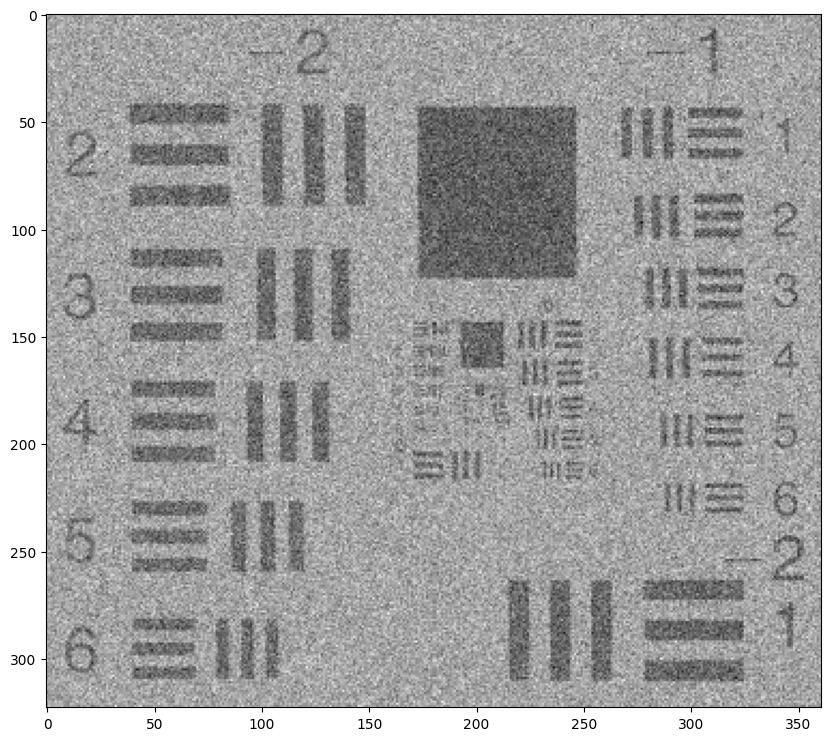

In [41]:
# Loading images
im_obs=io.imread("https://perso.telecom-paristech.fr/tupin/cours/IMA203/TPMARKOV/Iobservee.png") # Observed image, noisy
im_orig=io.imread("https://perso.telecom-paristech.fr/tupin/cours/IMA203/TPMARKOV/IoriginaleBW.png") # Binary reference image, to assess the quality of the segmentation

plt.imshow(im_obs,cmap='gray')

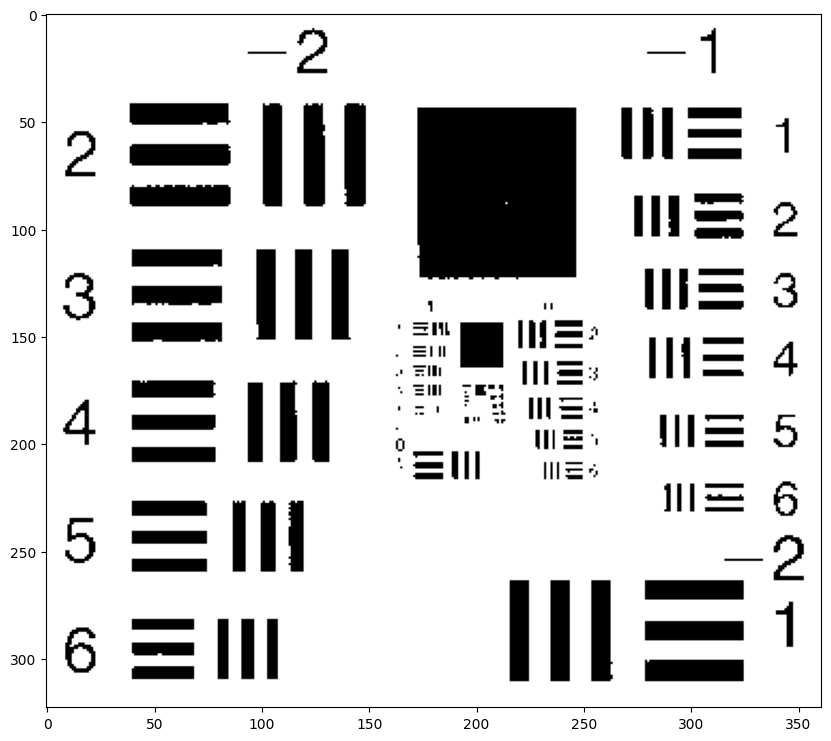

In [42]:
plt.imshow(im_orig, cmap='gray')

In [43]:
#### to be completed
# TO BE COMPLETED EX1
beta = 1700 # beta value
m0 = 97.0 # m0 and m1 values from the previous practical work
m1 = 163.0

## binary graph-cut

# Create the graph.
g = maxflow.Graph[float]() # Graph instantiation

# Add the nodes.
# nodeids has the identifiers of the nodes in the grid.
# It creates a set of nodes for all the pixels of the image
nodeids = g.add_grid_nodes(im_obs.shape)

# Add non-terminal edges with the same capacity.
# the edge has the value beta for all adjacent pixels in 4-connexity
g.add_grid_edges(nodeids, beta)

# Add the terminal edges.
# the second argument correspond to the set of edge values to the source
# the third argument correspond to the set of edge values to the sink
g.add_grid_tedges(nodeids, (im_obs-m0)**2, (im_obs-m1)**2)

# Find the maximum flow.
flow = g.maxflow()

print("Max Flow:", str(flow))
# Get the labels of the nodes in the grid.
# output is 0 if the node is connected to the source, else output is 1
sgm = g.get_grid_segments(nodeids)
im_bin = np.int_(np.logical_not(sgm))


Max Flow: 75654498.0


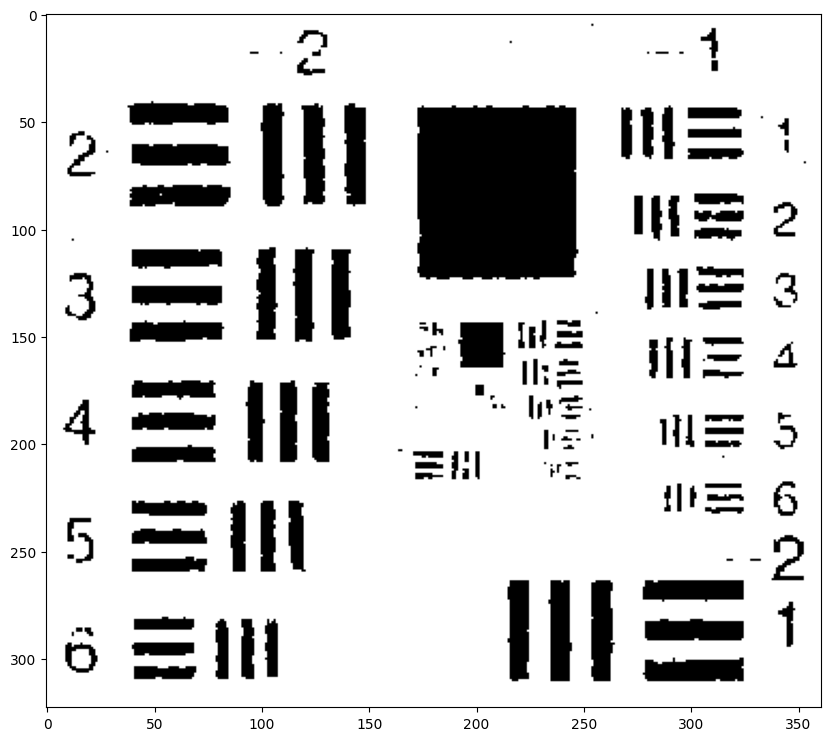

In [44]:
plt.imshow(im_bin,cmap='gray')

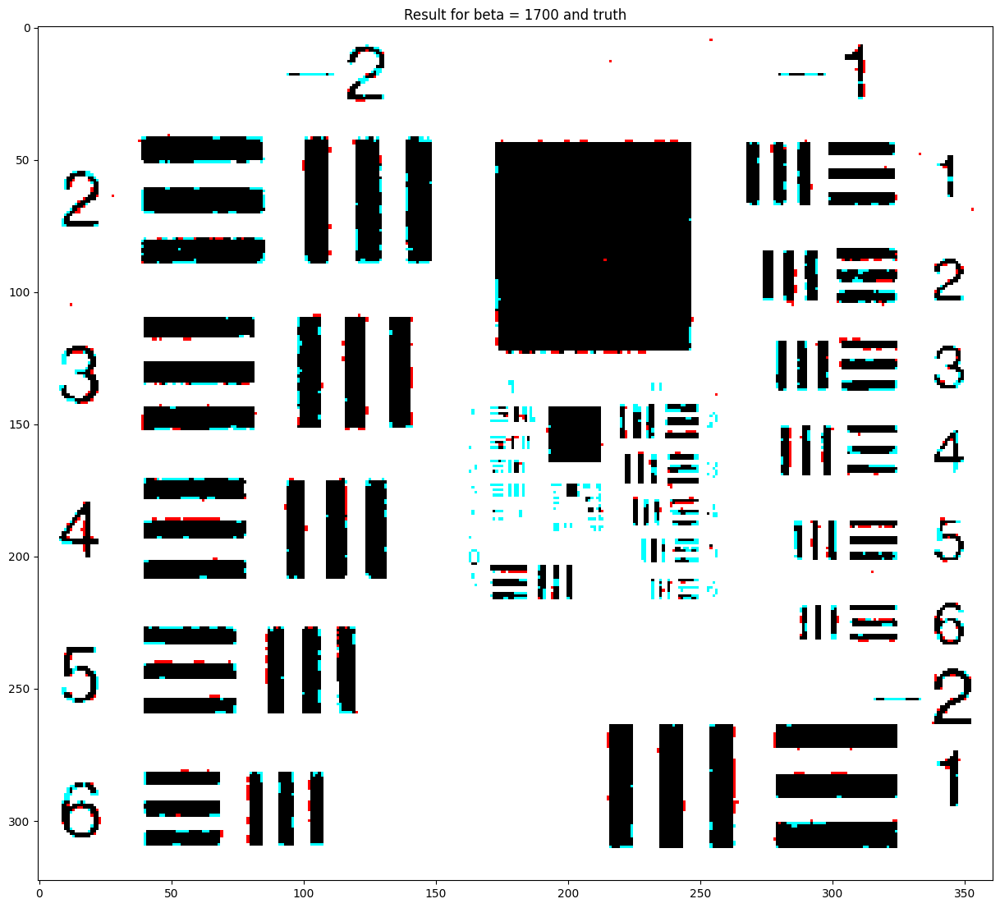

Number of misclassified pixels for beta =  1700 :  2206


In [45]:
# compute the error image between im_bin and im_orig (the ideal solution) using np.abs and np.sum
error = np.sum(np.abs(im_bin - im_orig))
plt.rcParams['figure.figsize'] = [15, 15]
# visualize the differences between the original image and the solution
plt.figure()
plt.imshow(np.dstack((np.int_(im_orig), im_bin, im_bin))*255)
plt.title("Result for beta = " + str(beta) + " and truth")
plt.show()

print("Number of misclassified pixels for beta = ",beta,": ",int(error))

### Search for the best parameter $\beta$

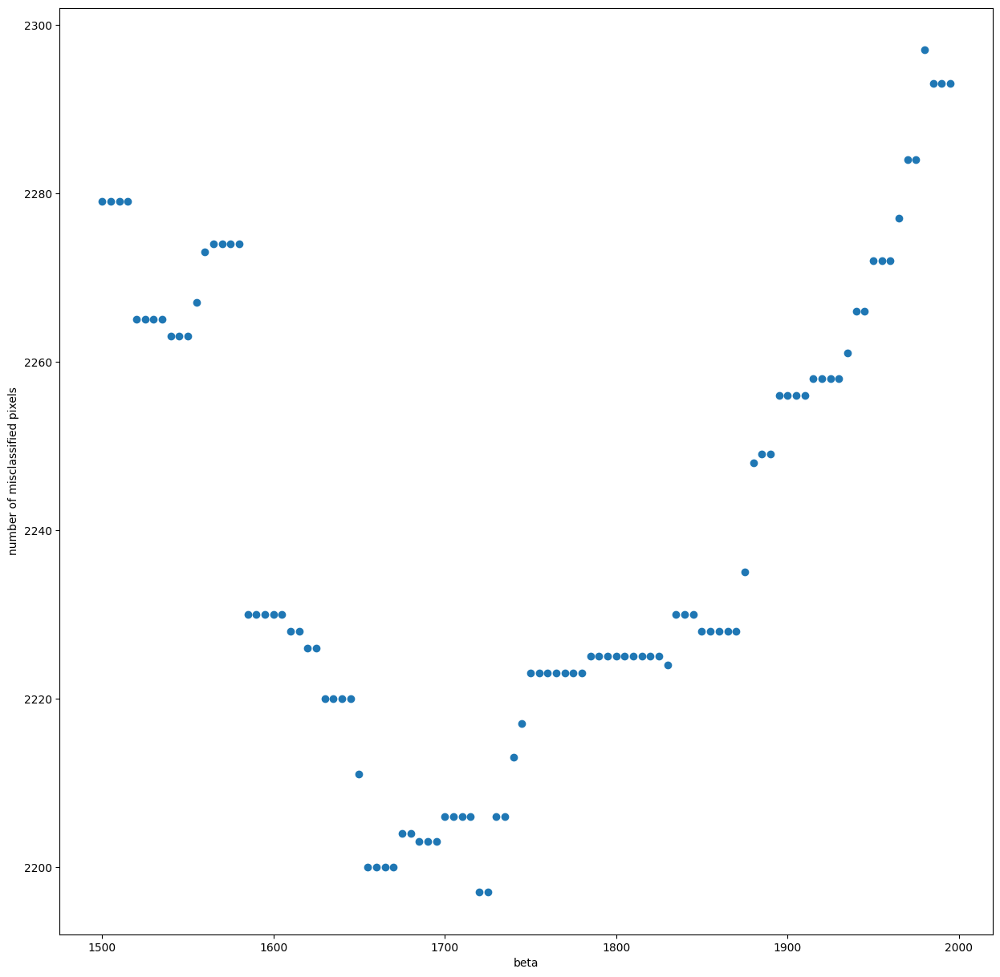

Best beta value:  1720


In [46]:
im_obs=io.imread("https://perso.telecom-paristech.fr/tupin/cours/IMA203/TPMARKOV/Iobservee.png") # Observed image, noisy
im_orig=io.imread("https://perso.telecom-paristech.fr/tupin/cours/IMA203/TPMARKOV/IoriginaleBW.png") # Binary reference image, to assess the quality of the segmentation

list_beta = []
list_errors = []

# TO BE COMPLETED - choose a range of values and a step to study beta
for beta in range(1500,2000,5):
    # TO BE COMPLETED
    m0 = 97.0
    m1 = 163.0

    ## Binary graph cut

    # Create the graph
    g = maxflow.Graph[float]() # graph instantiation

    # Add the nodes. nodeids has the identifiers of the nodes in the grid.
    nodeids = g.add_grid_nodes(im_obs.shape)
    # Add non-terminal edges with the same capacity.
    g.add_grid_edges(nodeids,beta)
    # Add the terminal edges.
    #TO BE COMPLETED
    g.add_grid_tedges(nodeids, (im_obs-m0)**2, (im_obs-m1)**2)

    # Find the maximum flow.
    flow = g.maxflow()

    # Get the segments of the nodes in the grid.
    sgm = g.get_grid_segments(nodeids)
    # create the output image
    im_bin = np.int_(np.logical_not(sgm))

    # print("beta = ",beta)
    # compute the error
    #TO BE COMPLETED
    error = np.sum(np.abs(im_bin - im_orig))
    list_beta.append(beta)
    list_errors.append(error)

plt.figure()
plt.scatter(list_beta,list_errors)
plt.xlabel("beta")
plt.ylabel("number of misclassified pixels")
plt.show()

best_beta = list_beta[np.argmin(np.array(list_errors))]

print('Best beta value: ', best_beta)

## 2. Classification of a colour image

The objective of this part is to carry out an extension of the method seen previously in the case of the treatment of a colour image *avions.png* in which one wants to separate the objects from the background.

We will first use the same framework (Ising model) as before but with a three-dimensional data attachment (assuming convariance matrices equal to the identity). Then we will introduce a CRF (conditional random field) by weighting the regularisation term of the Ising model by the modulus of the gradient between two pixels of the observed image.  

### 2.1 Binary classification
From the program structure below, carry out the different steps necessary for this classification:
1. Modelling of the background and object distributions (in 3 dimensions this time)
1. Definition of the data attachment term
1. Choice of a value for the regularisation parameter for the Ising model
1. Finding the minimal cut to obtain the object/background classification.

Q9: Comment on these steps and the results obtained.

**Your answer &#x270D;**

A9:
- Modelisation : We consider the binary problem where we have a class for the sky and a class for the planes.
- Data attachement term : We choose to model each class, and for each channel, by a Gaussian distribution with a calculated mean. We assume equal variances for all classes. The data attachment term corresponds to the squared norm of the distance from a pixel to the mean of the considered class. We therefore replace the quadratic term by the sum of the squared norms on each channel.
- Regularisation term : A good value of \beta is arround 10000.

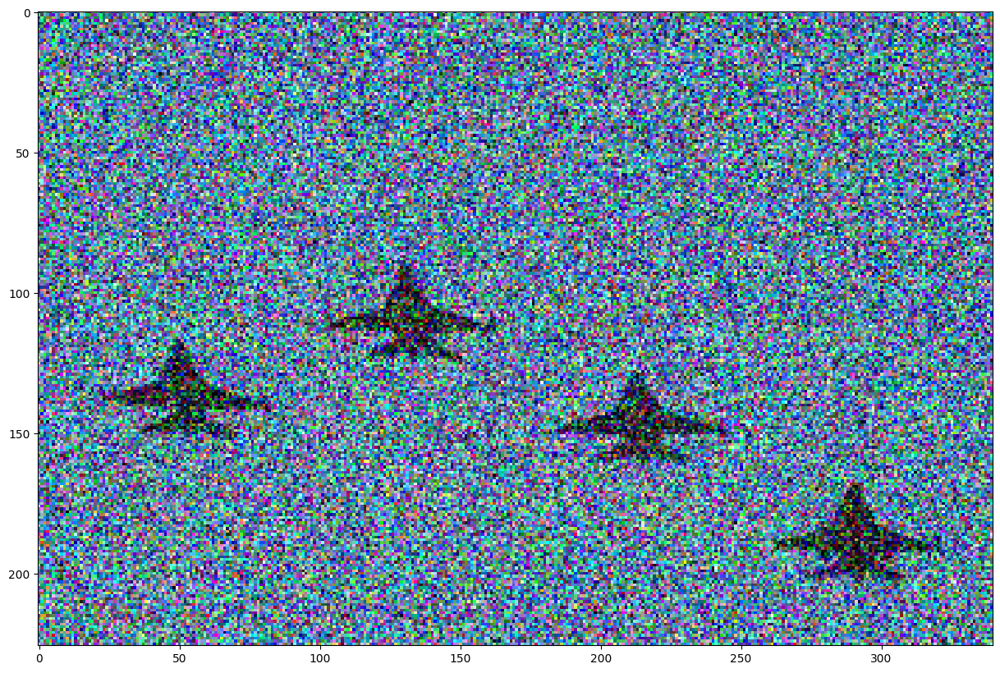

In [47]:
# Loading and displaying the image
#im_planes=io.imread('https://www.dropbox.com/s/ylm0ut8ipu5oonb/avions.png?dl=1')
im_planes=io.imread("https://perso.telecom-paristech.fr/tupin/cours/IMA203/TPMARKOV/planes.png")

plt.figure()
#plt.imshow(im_obs,vmin=0,vmax=255)
plt.rcParams['figure.figsize'] = [15, 15]
plt.imshow(im_planes)
plt.show()


#### Determining the parameters of the classes


Plane class: we can use the values of the rectangle [180:200,280:300].

example np.mean(image[180:200,280:300,1]) returns the average of the selected area for channel 1

In [48]:
# mean of the plane class - 3D vector
# TO BE COMPLETED
m_planes = [np.mean(im_planes[180:200,280:300,0]) , np.mean(im_planes[180:200,280:300,1]) , np.mean(im_planes[180:200,280:300,2]) ]

# mean of the sky class
# you can use values in the following square [0:100,150:300]
# TO BE COMPLETED
m_sky = [np.mean(im_planes[0:100,150:300,0]) , np.mean(im_planes[0:100,150:300,1]) , np.mean(im_planes[0:100,150:300,2]) ]

print('For the sky, [R,G,B] = ', m_sky)
print("For the planes, [R,G,B] = ", m_planes)

# check that the obtained values are coherent

For the sky, [R,G,B] =  [93.96126666666666, 127.14426666666667, 156.2286]
For the planes, [R,G,B] =  [53.645, 56.4725, 70.2075]


In [49]:

#affiche(im_bin, titre="Result for beta = " + str(beta));
# choose a beta value
# TO BE COMPLETED
beta = 12000

# TO BE COMPLETED
## Binary graph-cut
# use the previous program to create the graph and compute the cut
# be careful of computing the terminal weights using the 3D values
# you can compute 2 distance images with in each pixel the quadratic distance to the mean value
# of each class

# Create the graph.
g = maxflow.Graph[float]() # Graph instantiation

# Add the nodes.
# nodeids has the identifiers of the nodes in the grid.
# It creates a set of nodes for all the pixels of the image
nodeids = g.add_grid_nodes(im_planes.shape[0:2])

# Add non-terminal edges with the same capacity.
# the edge has the value beta for all adjacent pixels in 4-connexity
g.add_grid_edges(nodeids, beta)


g.add_grid_tedges(nodeids, np.sum((im_planes-m_sky)**2,axis=2), np.sum((im_planes-m_planes)**2,axis=2))

# Find the maximum flow.
flow = g.maxflow()

print("Max Flow:", str(flow))
# Get the labels of the nodes in the grid.
# output is 0 if the node is connected to the source, else output is 1
sgm = g.get_grid_segments(nodeids)
im_bin = np.int_(np.logical_not(sgm))



Max Flow: 1089397463.0270238


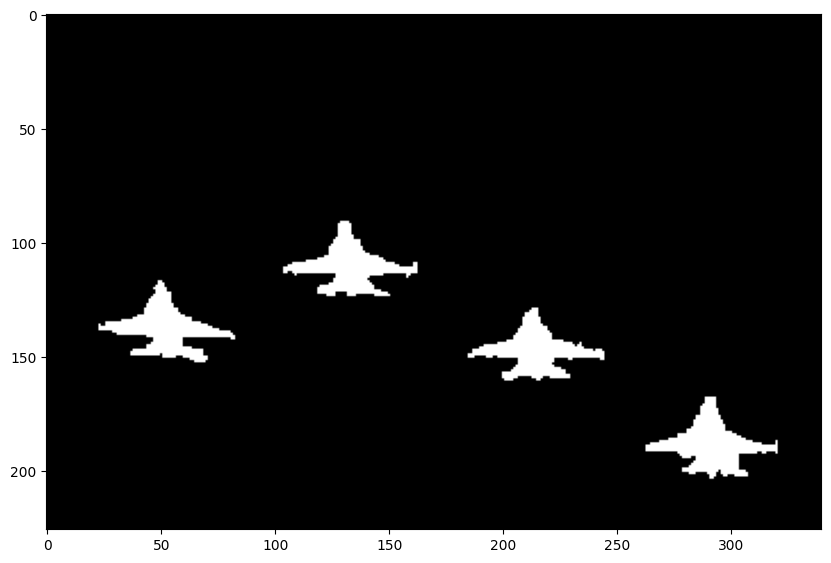

In [50]:
plt.rcParams['figure.figsize'] = [10, 10]
plt.imshow(im_bin,cmap="gray")

### 2.2 Use of a CRF (Conditional Random Field) model

We will try here to adapt the model used previously to favour transitions where they are compatible with the gradient. To do this, we will replace the constant $\beta$ for the whole image by a "beta_field" which depends on the norm of the gradient.

Q10: Calculate and display the modulus of the gradient of the aircraft image after it has been grayscaled and convolved by a Gaussian kernel of standard deviation 1. Why use the "boundary='symm'" option when convolving through the Sobel filter? Try it without doing the Gaussian filtering. What is the point?

**Your answer &#x270D;**

A10: We use the "boundary='symm'" option to ensure continuity at the edges of the image. In this case, continuity is ensured by symmetrizing the image at each edge. The Gaussian filter will slightly blur the image which will reduce the noise and therefore limit excessively large gradient values, and it will facilitate the contours detection.

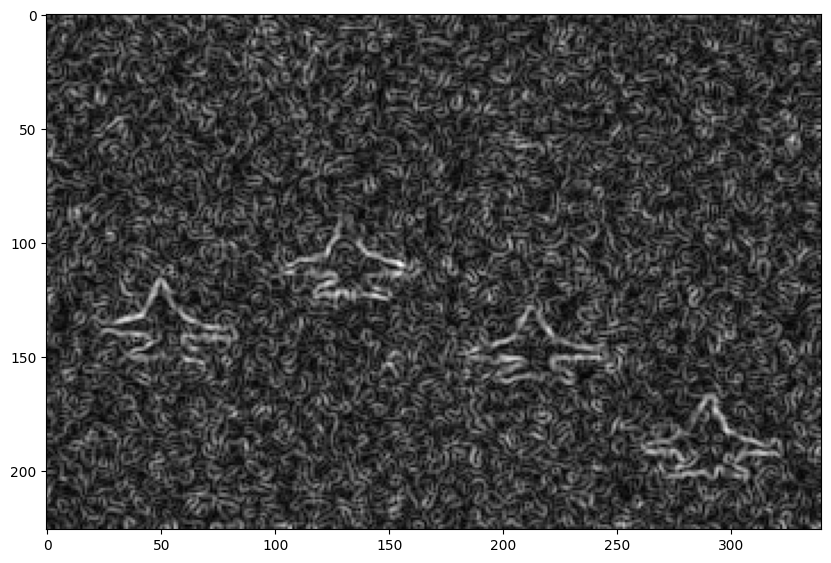

In [51]:
import scipy.signal
import scipy.ndimage
from skimage import color

def gradient(image):
    """ Array -> tuple[Array*Array]"""
    sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], dtype = float)
    sobel_y = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]], dtype = float)
    # to be completed
    # use mode = 'same' and boundary='symm' in scipy.signal.convolve2d
    # TO BE COMPLETED
    derivative_x = scipy.signal.convolve2d(image,sobel_x,mode='same',boundary='symm')
    derivative_y = scipy.signal.convolve2d(image,sobel_y,mode='same',boundary='symm')
    return([derivative_x,derivative_y])

plane_nb = scipy.ndimage.gaussian_filter(color.rgb2gray(im_planes), 1)
plane_x, plane_y = gradient(plane_nb)
# calculation of the gradient modulus
# TO BE COMPLETED
grad_av = np.sqrt(plane_x**2+plane_y**2)
plt.figure()
plt.imshow(grad_av,cmap = "gray")
plt.show()

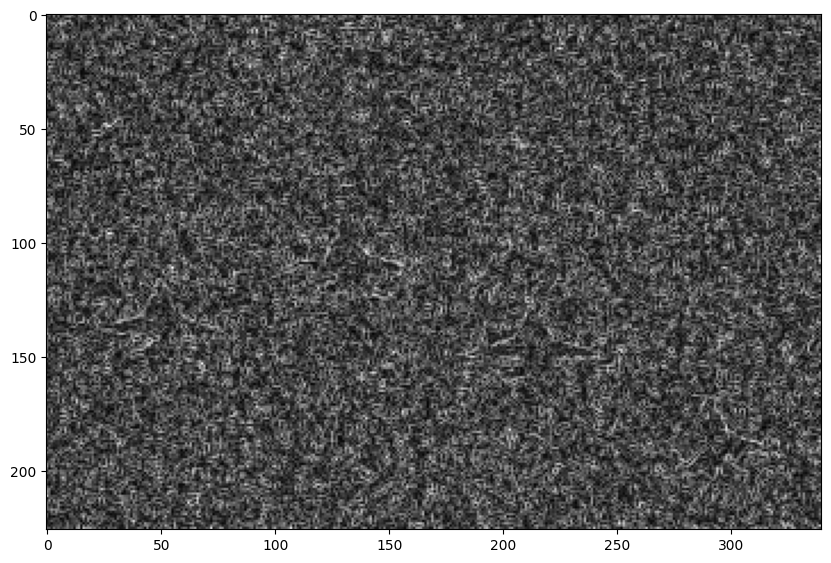

In [52]:
# Without gaussian filtering
plane_nb = color.rgb2gray(im_planes)
plane_x, plane_y = gradient(plane_nb)
# calculation of the gradient modulus
# TO BE COMPLETED
grad_av = np.sqrt(plane_x**2+plane_y**2)
plt.figure()
plt.imshow(grad_av,cmap = "gray")
plt.show()


Complete the code for segmentation by CRF. We will choose $beta\_field=\beta_2\cdot\exp(-grad\_av/h)$ We can use $h=300$ and $\beta_2=20000$. Also replace the constant beta by the field "beta_field" during the "g.add_grid_edges" step.

Q11: Compare the results with and without the contour term.

**Your answer &#x270D;**

A11: I don't get a big difference between the results with and without the contour term.

Max Flow: 1095980736.5742822


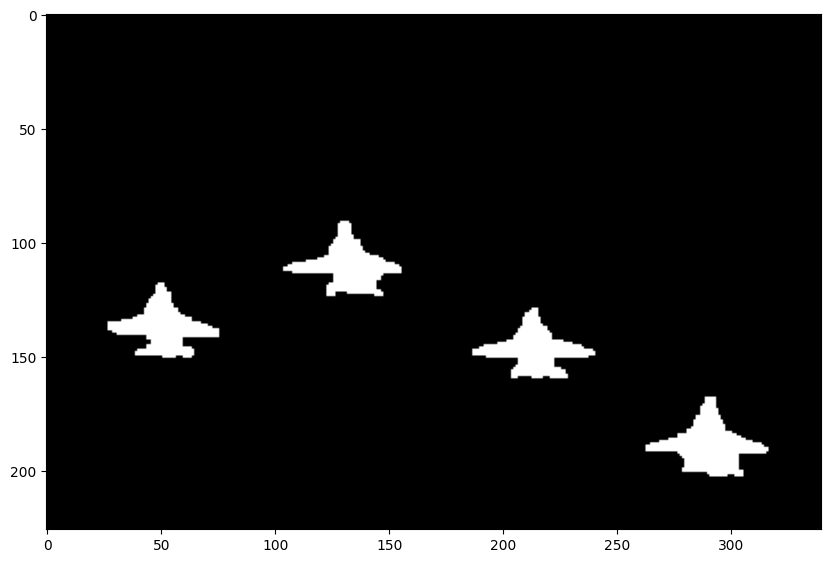

In [59]:
# calcul de beta_field
# ce champ définira la valeur pour les 4-voisins
# TO BE COMPLETED
h = 300
beta2 = 20000
beta_field = beta2 * np.exp(-grad_av/h)

## Graph cut binaire
# compléter en reprenant votre code précédent et en remplaçant
# beta par beta_field dans la ligne g.add_grid_edges
g = maxflow.Graph[float]() #Instanciation du graph

# Add the nodes.
# nodeids has the identifiers of the nodes in the grid.
# It creates a set of nodes for all the pixels of the image
nodeids = g.add_grid_nodes(im_planes.shape[0:2])

# Add non-terminal edges with the same capacity.
# the edge has the value beta for all adjacent pixels in 4-connexity
g.add_grid_edges(nodeids, beta_field)

# Add the terminal edges.
# the second argument correspond to the set of edge values to the source
# the third argument correspond to the set of edge values to the sink
g.add_grid_tedges(nodeids, np.sum((im_planes-m_sky)**2,axis=2), np.sum((im_planes-m_planes)**2,axis=2))
# Find the maximum flow.
flow = g.maxflow()
print("Max Flow:", str(flow))
# Get the labels of the nodes in the grid.
# output is 0 if the node is connected to the source, else output is 1


# Get the segments of the nodes in the grid.
sgm = g.get_grid_segments(nodeids)
im_bin_wgrad = np.int_(np.logical_not(sgm))

plt.imshow(im_bin_wgrad, cmap = "gray")

Number of different pixels 255  (  0.33185840707964603 % )


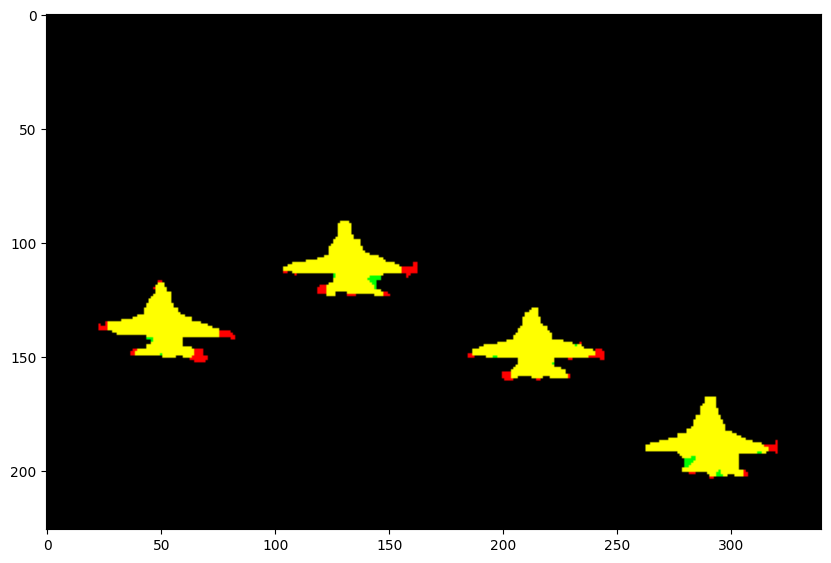

In [60]:
plt.imshow(np.dstack([im_bin,im_bin_wgrad,np.zeros(im_bin.shape)]))
diff = np.sum(np.abs(im_bin - im_bin_wgrad))
print("Number of different pixels",diff," ( ", diff/(im_bin.shape[0]*im_bin.shape[1]) *100, "% )")


## 3. Iterative Segmentation with Gaussian Mixture

Q12: Display the "zebra" image below. Is it possible to segment the zebra with the method used to segment the planes?



**Your answer &#x270D;**

A12: We cannot directly use the previous method to segment the image because the color of the zebra is not uniform.

uint8


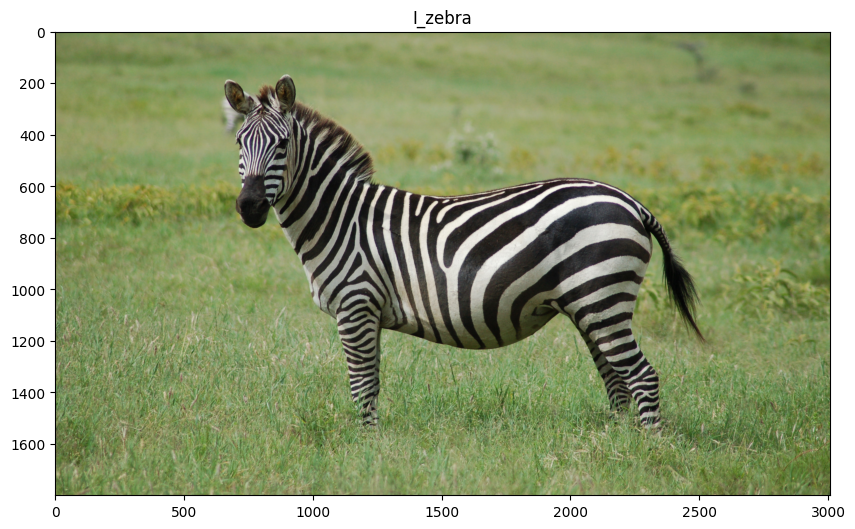

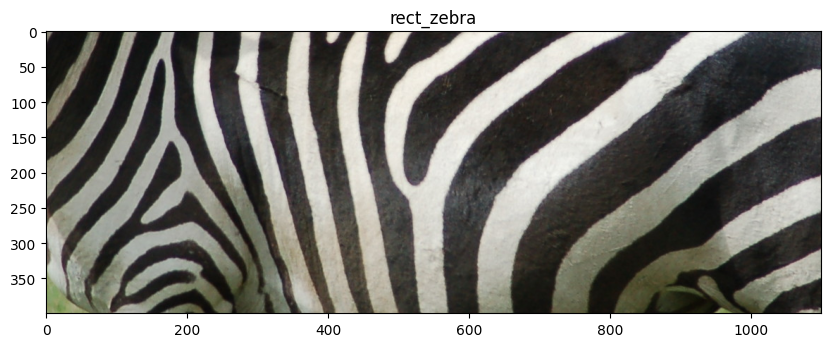

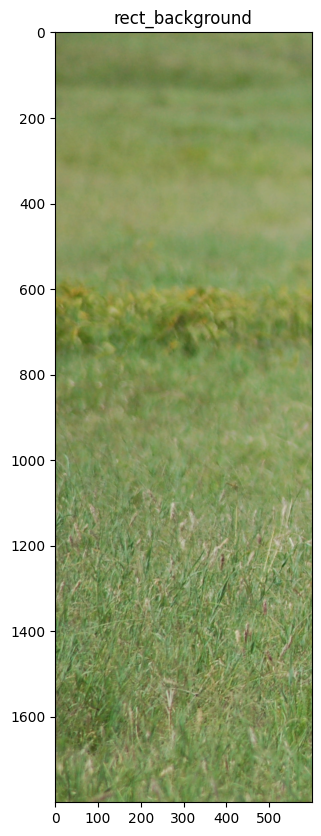

In [61]:
### Loading a new image
I_zebra = io.imread("https://perso.telecom-paristech.fr/tupin/cours/IMA203/TPMARKOV/Equus_quagga.jpg")
I_zebra = I_zebra[200:,:,:]
rect_zebra = I_zebra[700:1100,1000:2100]
rect_background = I_zebra[:,0:600]
print(I_zebra.dtype)

plt.figure()
plt.imshow(I_zebra)
plt.title('I_zebra')
plt.show()

plt.figure()
plt.imshow(rect_zebra)
plt.title('rect_zebra')
plt.show()

plt.figure()
plt.imshow(rect_background)
plt.title('rect_background')
plt.show()

Q13: Calculate the covariance matrix for the rect_zebra and the rect_background. Display the values and comment on the result. What do the diagonal values correspond to?

**Your answer &#x270D;**

A13: The diagonal values correspond to the variance of the image section chosen by channel RGB. We notice that the diagonal values of the covariance matrix of the area of the image corresponding to the background are quite low. This speaks to the fact that the color of the image is fairly uniform because the channels are correlated. On the other hand, we observe quite the opposite with high values for the zebra image. In fact there are two very different colors, the variances for each channel are therefore significant.

In [34]:
print(I_zebra.shape)
V_tulip = np.vstack([I_zebra[:,:,i].flatten() for i in range(3)])
print(I_zebra.shape)

M_cov = np.cov(np.vstack([I_zebra[:,:,i].flatten() for i in range(3)]))
print('Full zebra image')
print(M_cov)

M_cov = np.cov(np.vstack([rect_zebra[:,:,i].flatten() for i in range(3)]))
print('Rectangle zebra')
print(M_cov)

M_cov = np.cov(np.vstack([rect_background[:,:,i].flatten() for i in range(3)]))
print('Rectangle background')
print(M_cov)

(1800, 3008, 3)
(1800, 3008, 3)
Full zebra image
[[1505.54438095 1533.04278068 1229.71568017]
 [1533.04278068 1691.10755214 1221.09280991]
 [1229.71568017 1221.09280991 1210.38328951]]
Rectangle zebra
[[5504.73383563 5535.4436469  5290.02896111]
 [5535.4436469  5588.18500866 5329.06646681]
 [5290.02896111 5329.06646681 5143.99751626]]
Rectangle background
[[313.37936128 226.13253307 255.56699124]
 [226.13253307 219.38193629 221.71082516]
 [255.56699124 221.71082516 308.63086939]]


Q14: Display the histogram for the R, G and B channels for the "rect_zebra" image. Comment on the result.

**Your answer &#x270D;**

A14: For the image "rect_zebra", there is different maximas in the histograms of the three channels which means there is many classes of colors in the images. In the contrary, we find that the histograms of the three channels in the image "rect_background" just one maxima meaning there isn't much variantion of colors in the image.

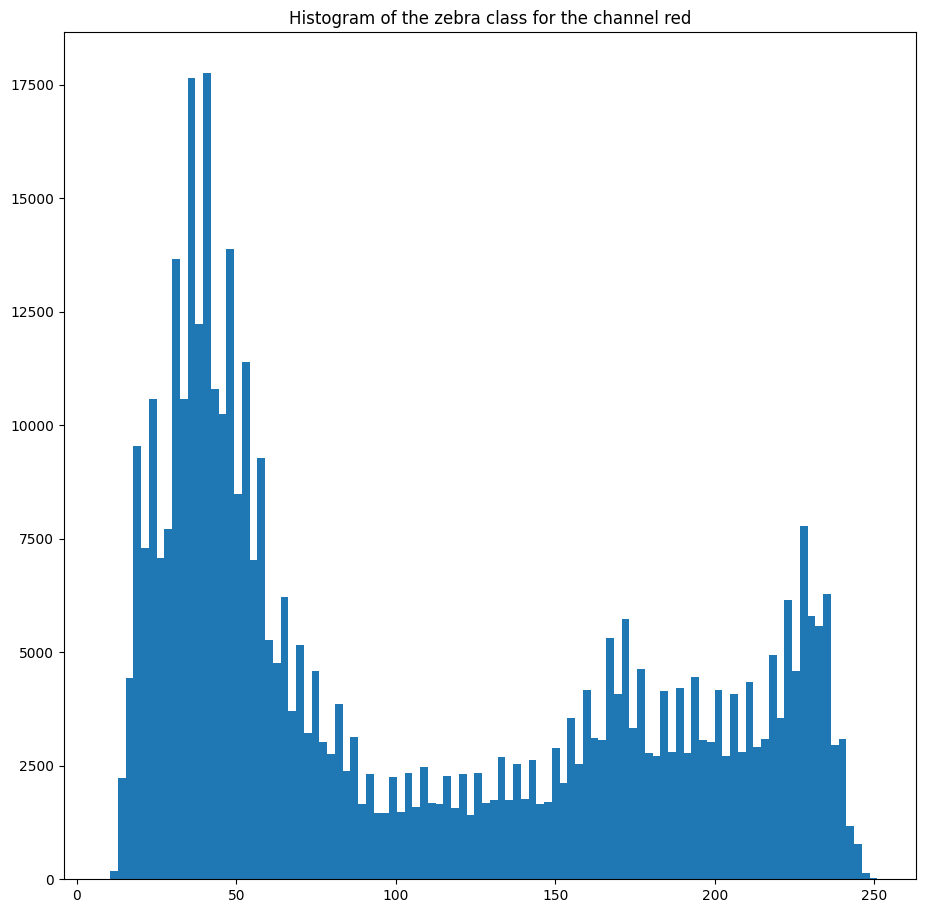

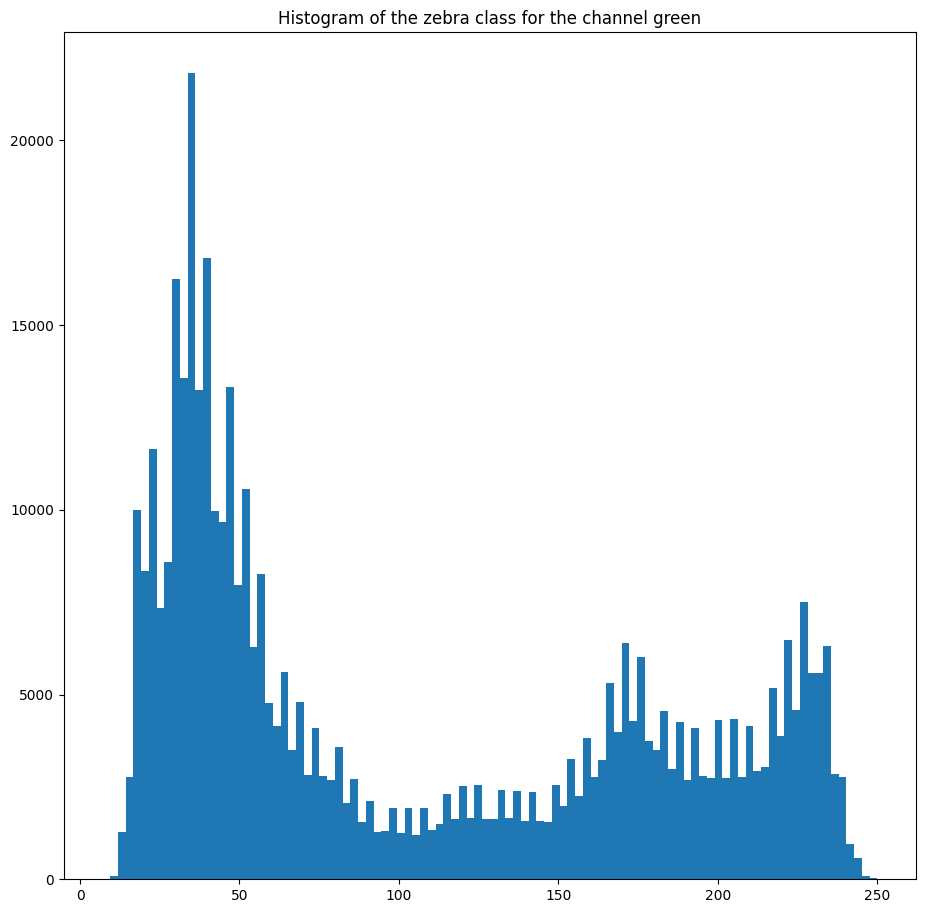

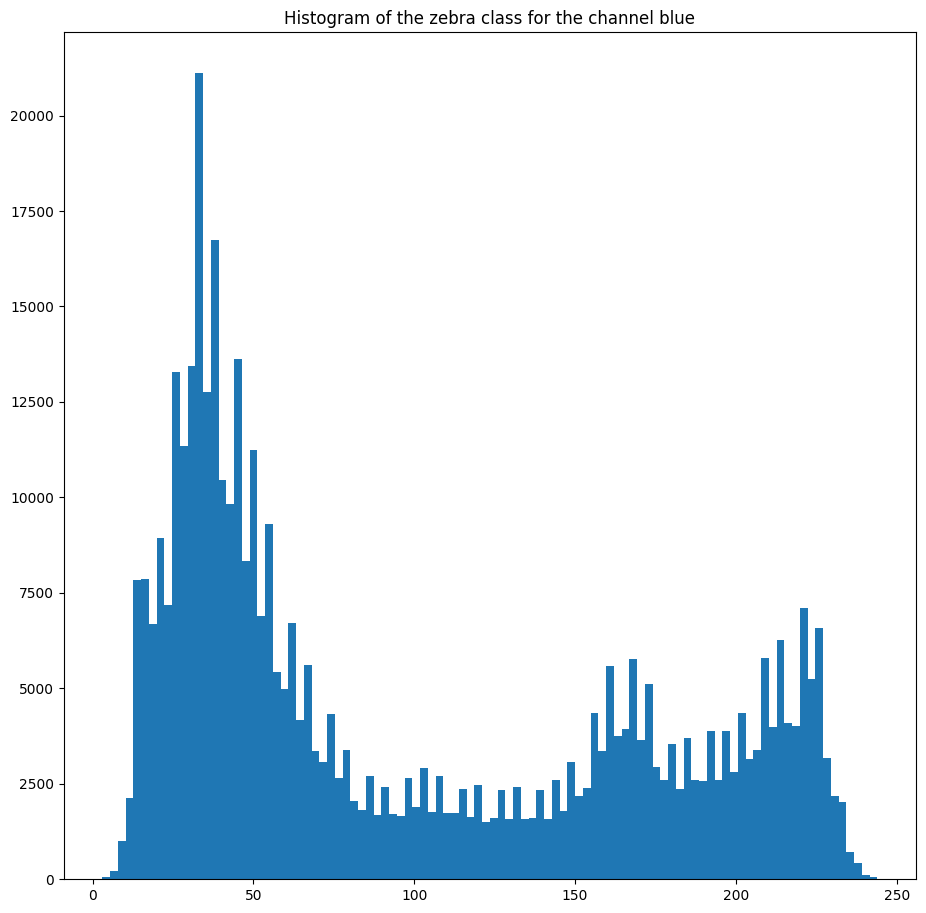

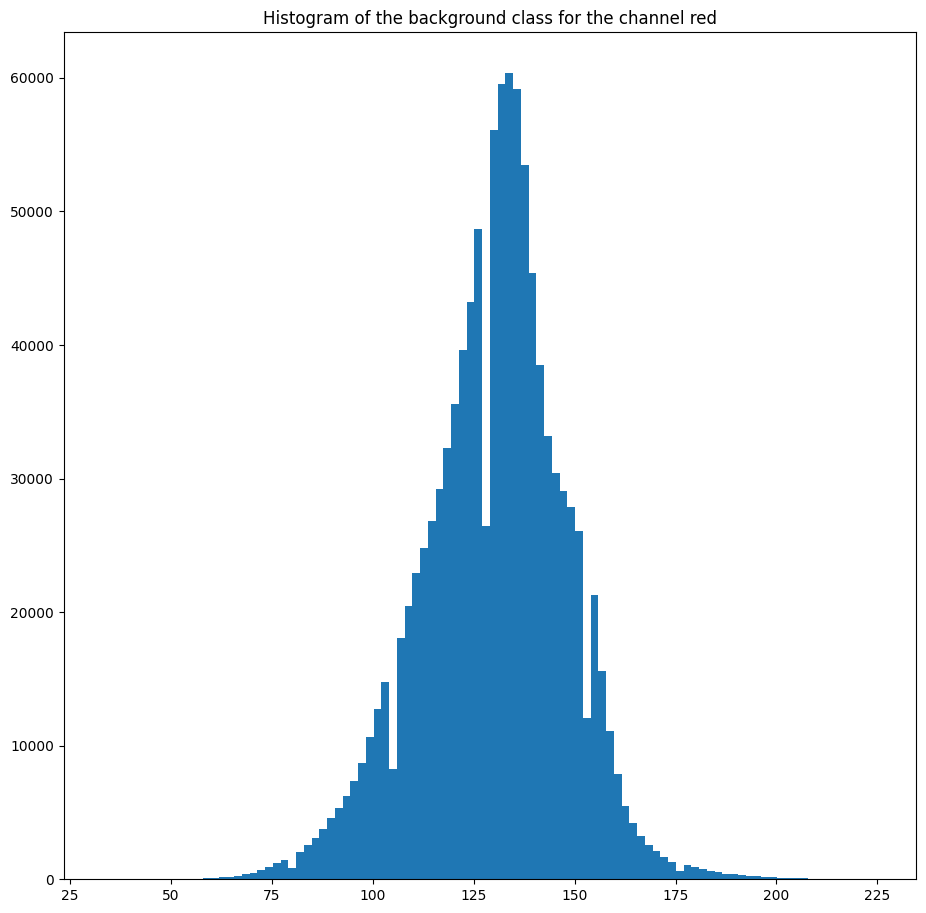

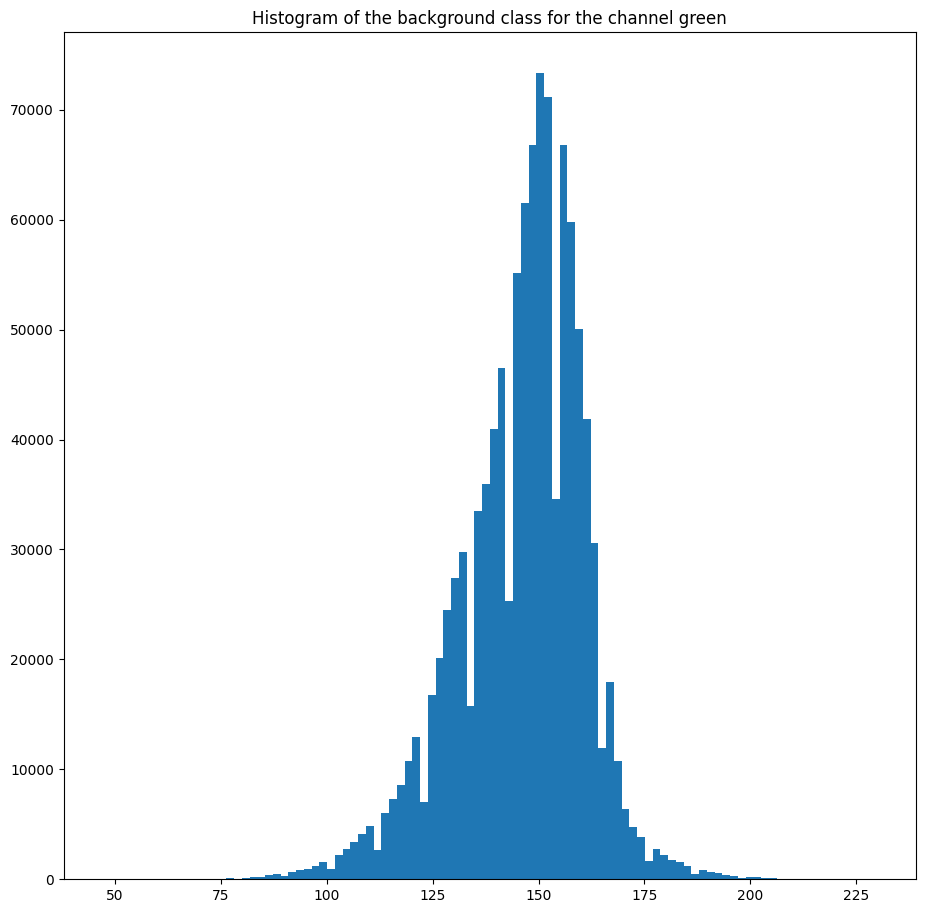

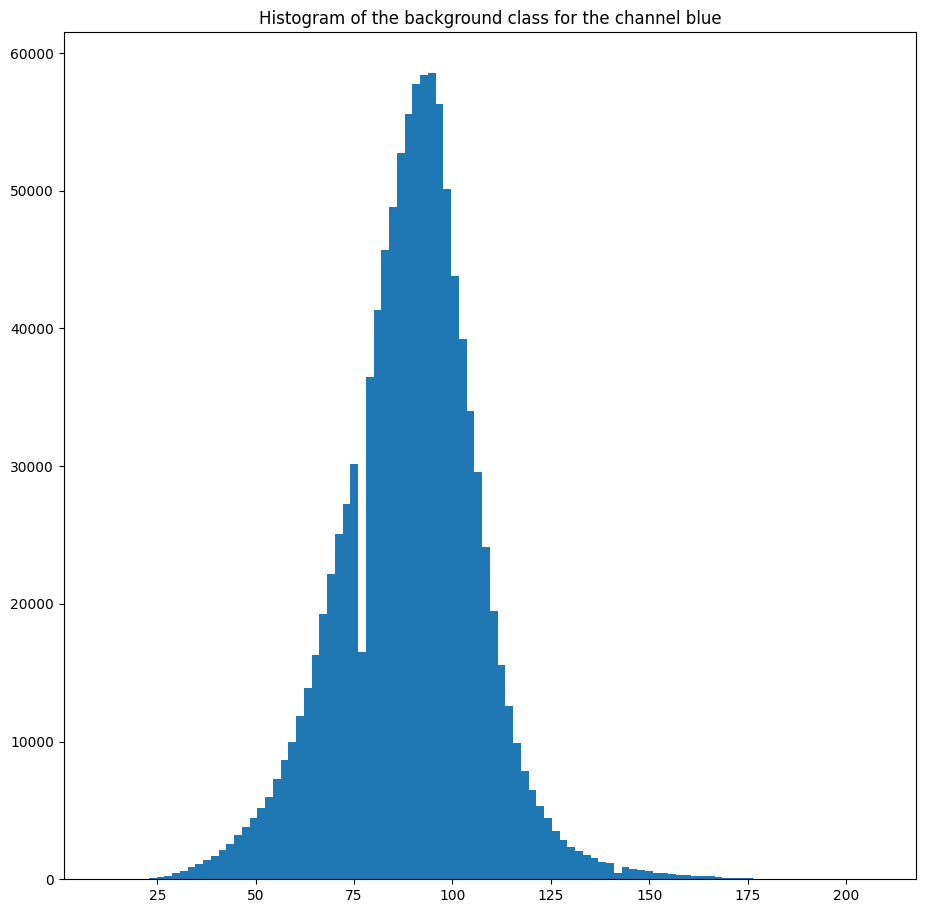

In [35]:
# allows you to change the display size of plt.show
plt.rcParams['figure.figsize'] = [11, 11]

nomchan = ["red","green", "blue"]
for chan in range(3):
    plt.figure()
    plt.hist(rect_zebra[:,:,chan].flatten(),100)
    plt.title("Histogram of the zebra class for the channel " + nomchan[chan])
    plt.show()



for chan in range(3):
    plt.figure()
    plt.hist(rect_background[:,:,chan].flatten(),100)
    plt.title("Histogram of the background class for the channel " + nomchan[chan])
    plt.show()

Q15: Propose an algorithmic method to identify the two classes of the image "rect_zebra". Use a sklearn implementation of this algorithm to identify the mean vectors ($m_R$,$m_G$,$m_B$) for two classes of the "rect_zebra" image and two classes of the "rect_background" image.

*The following line of code can be used to transform the image into a suitable form.*

X = np.vstack([rect_zebra[:,:,i].flatten() for i in range(3)]).transpose()

Comment on the average vectors obtained. They can be displayed as an image using the code provided.

**Your answer &#x270D;**

A15: We use the KMeans algorithm on the histogram to determine the average of each class on each channel from the centroids. We find white  and black for the zebra, while we have two shades of green for the background.

In [62]:
# computation of class parameters in a semi-automatic way
from sklearn.cluster import KMeans
import numpy as np

# use a number of classes =2 for the zebra part (complete n_clusters=?)
X = np.vstack([rect_zebra[:,:,i].flatten() for i in range(3)]).transpose()
kmeans_zebra = KMeans(n_clusters=2, random_state=0).fit(X)
mean_vectors_zebra = kmeans_zebra.cluster_centers_

# use a number of classes =2 for the background part
X = np.vstack([rect_background[:,:,i].flatten() for i in range(3)]).transpose()
kmeans_background = KMeans(n_clusters=2, random_state=0).fit(X)
mean_vectors_background = kmeans_background.cluster_centers_

C:\Users\m\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\m\AppData\Roaming\Python\Python311\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
found 0 physical cores < 1
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "C:\Users\m\AppData\Roaming\Python\Python311\site-packages\joblib\externals\loky\backend\context.py", line 282, in _count_physical_cores
    raise ValueError(f"found {cpu_count_physical} physical cores < 1")
C:\Users\m\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default 

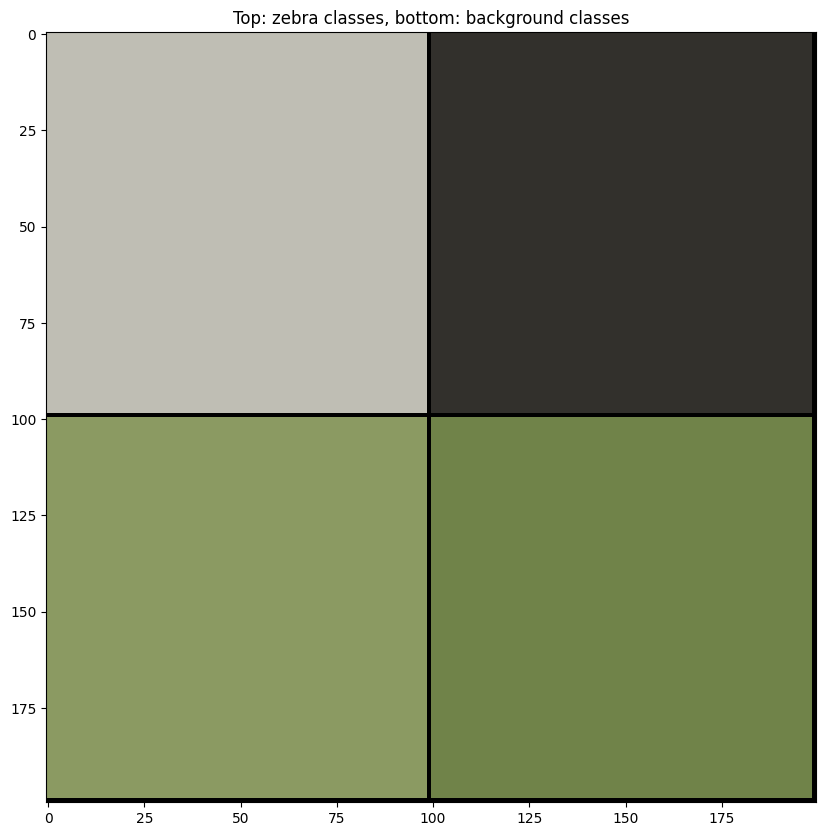

In [63]:
# display of the class centers found as an image
image_mean_vectors = np.zeros((200,200,3),np.uint8)
for i in range(3):
    image_mean_vectors[0:99,0:99,i] = mean_vectors_zebra[0,i]
    image_mean_vectors[0:99,100:199,i] = mean_vectors_zebra[1,i]
    image_mean_vectors[100:199,0:99,i] = mean_vectors_background[0,i]
    image_mean_vectors[100:199,100:199,i] = mean_vectors_background[1,i]

plt.figure()
plt.imshow(image_mean_vectors,vmax = 255)
plt.title("Top: zebra classes, bottom: background classes")
plt.show()

Q16: Display separately two neg-log-likelihood images (the neg-log-likelihood was used as a data attachment in the previous example) for the two zebra classes.
Build a neg-log-likelihood image corresponding to the minimum of the two neg-log-likelihoods of the zebra classes. Similarly for the background class.

Display them and comment.

**Your answer &#x270D;**

A16: For the zebra, each likelihood will make it possible to identify a stripe color. The first likelihood gives a low error for one type of stripe, and the other likelihood for the other type of stripe. This allowes that the background is almost never associated with stripes. Consequently the minimum of the two likelihoods makes it possible to identify the zebra.

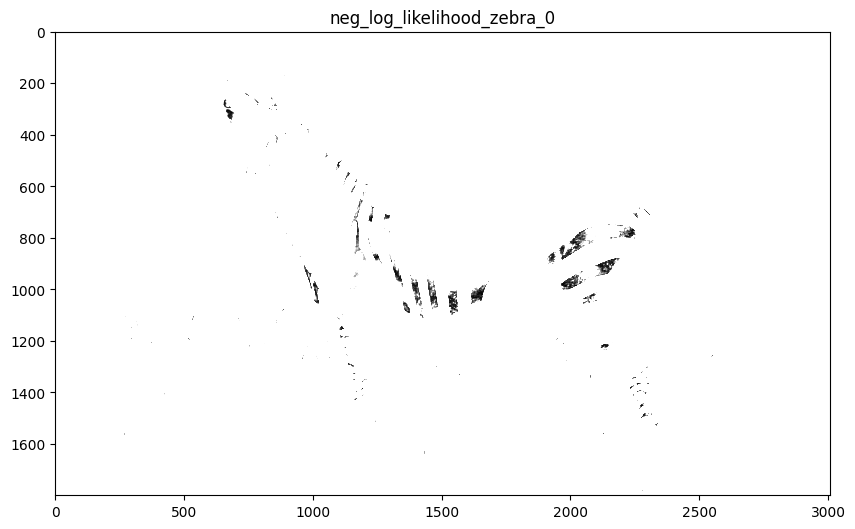

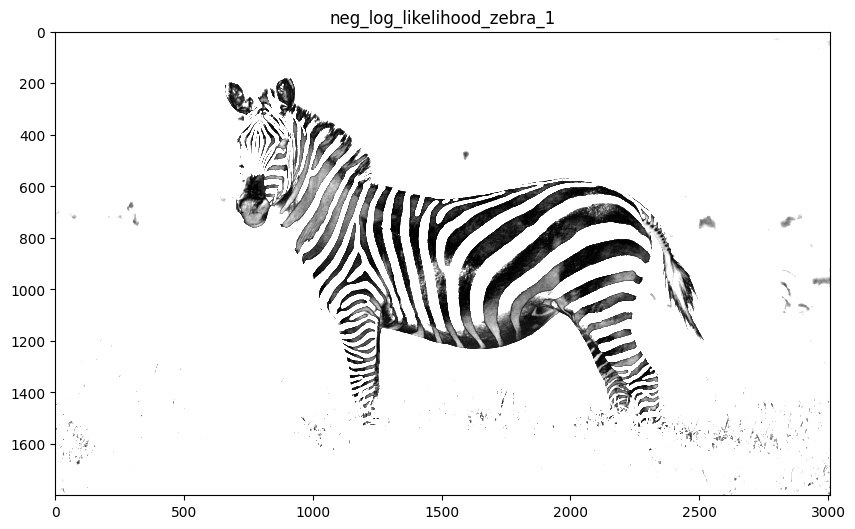

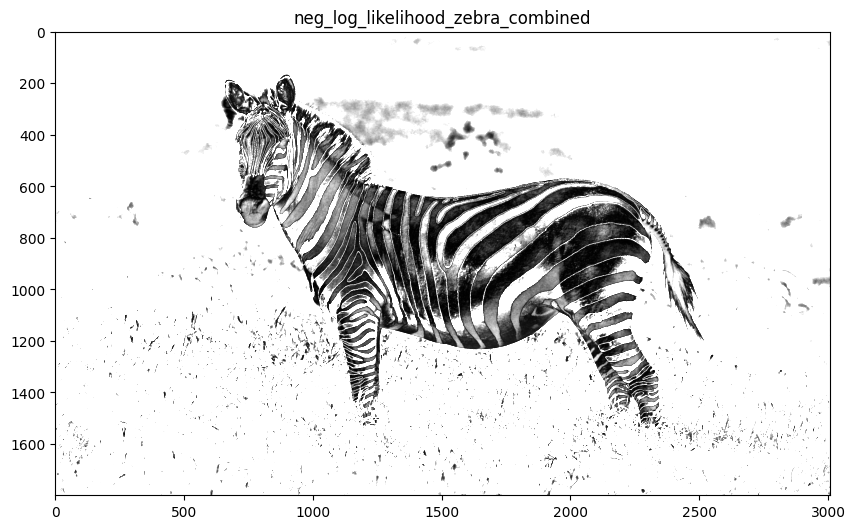

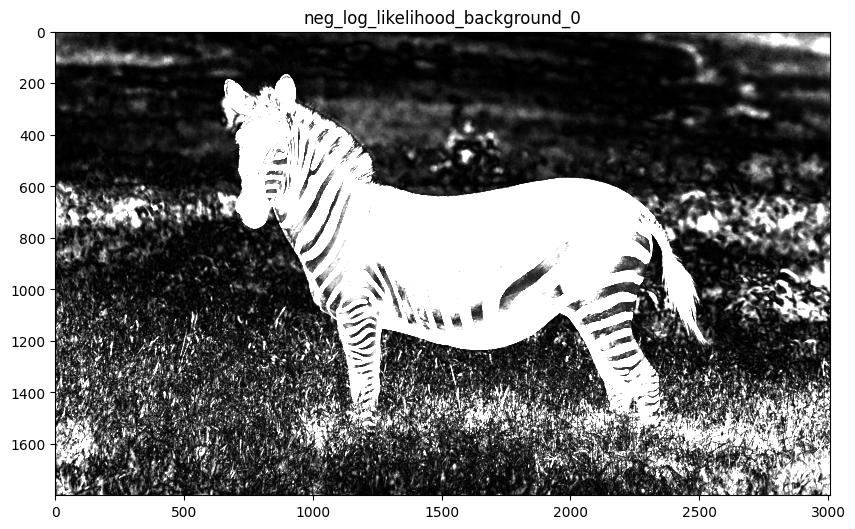

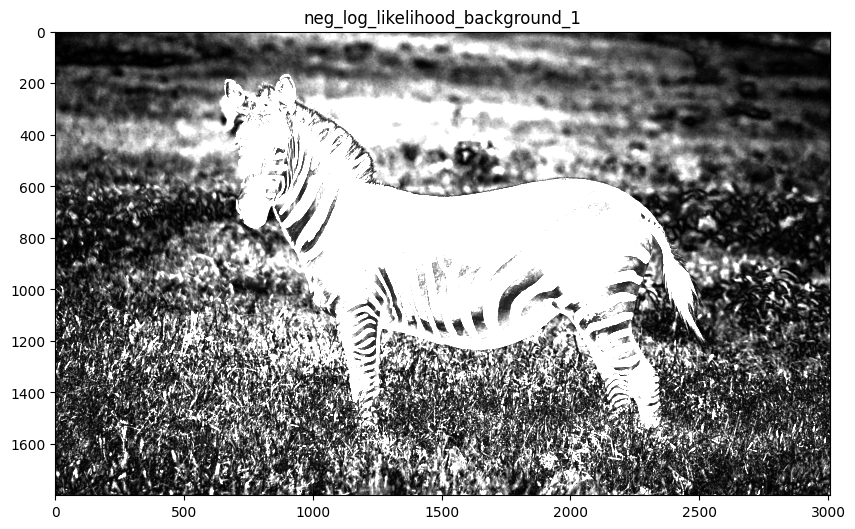

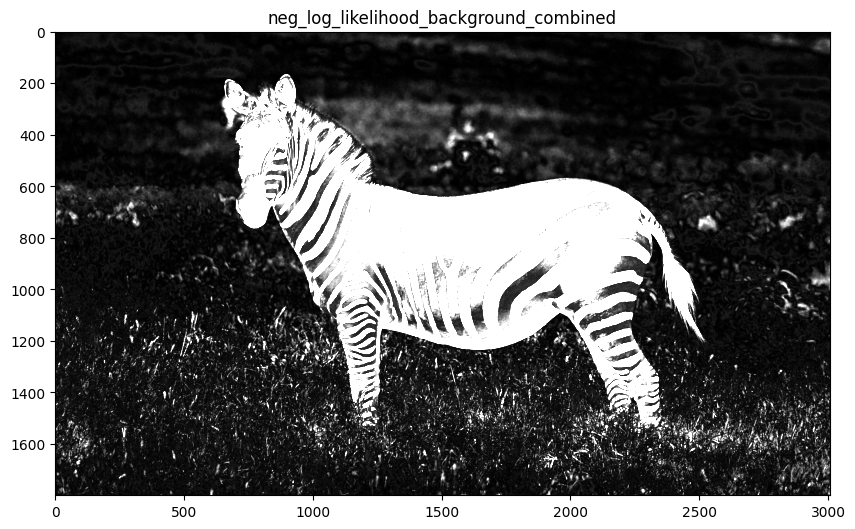

In [65]:
# calculation of the neg-log-likelihood of the zebra class
neg_log_likelihood_zebra_0 = sum((I_zebra[:,:,i]-mean_vectors_zebra[0,i])**2 for i in range(3))

plt.figure()
plt.imshow(neg_log_likelihood_zebra_0,cmap='gray', vmax = 600)
plt.title("neg_log_likelihood_zebra_0")
plt.show()

neg_log_likelihood_zebra_1 = sum((I_zebra[:,:,i]-mean_vectors_zebra[1,i])**2 for i in range(3))

plt.figure()
plt.imshow(neg_log_likelihood_zebra_1,cmap='gray', vmax = 5000)
plt.title("neg_log_likelihood_zebra_1")
plt.show()

neg_log_likelihood_zebra_combined = np.minimum(sum((I_zebra[:,:,i]-mean_vectors_zebra[0,i])**2 for i in range(3)),sum((I_zebra[:,:,i]-mean_vectors_zebra[1,i])**2 for i in range(3)))

plt.figure()
plt.imshow(neg_log_likelihood_zebra_combined,cmap='gray', vmax = 5000)
plt.title("neg_log_likelihood_zebra_combined")
plt.show()

# TO BE COMPLETED
# calculate the neg-log-likelihood of the background
# call the output neg_log_likelihood_background_combined
neg_log_likelihood_background_0 = sum((I_zebra[:,:,i]-mean_vectors_background[0,i])**2 for i in range(3))

plt.figure()
plt.imshow(neg_log_likelihood_background_0,cmap='gray', vmax = 5000)
plt.title("neg_log_likelihood_background_0")
plt.show()

neg_log_likelihood_background_1 = sum((I_zebra[:,:,i]-mean_vectors_background[1,i])**2 for i in range(3))

plt.figure()
plt.imshow(neg_log_likelihood_background_1,cmap='gray', vmax = 5000)
plt.title("neg_log_likelihood_background_1")
plt.show()

neg_log_likelihood_background_combined = np.minimum(neg_log_likelihood_background_0,neg_log_likelihood_background_1)
plt.figure()
plt.imshow(neg_log_likelihood_background_combined,cmap='gray', vmax = 5000)
plt.title("neg_log_likelihood_background_combined")
plt.show()




Q17: From these combined data attachment images (one for the background and one for the zebra), set up a graph-cut segmentation of the image with the $\beta$ of your choice. Comment the result.

**Your answer &#x270D;**

A17:

Max Flow: 6933629369.490822


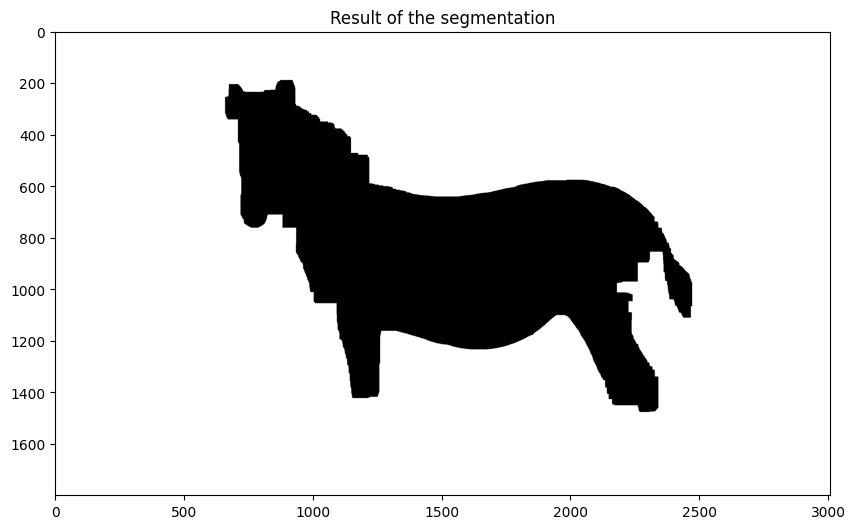

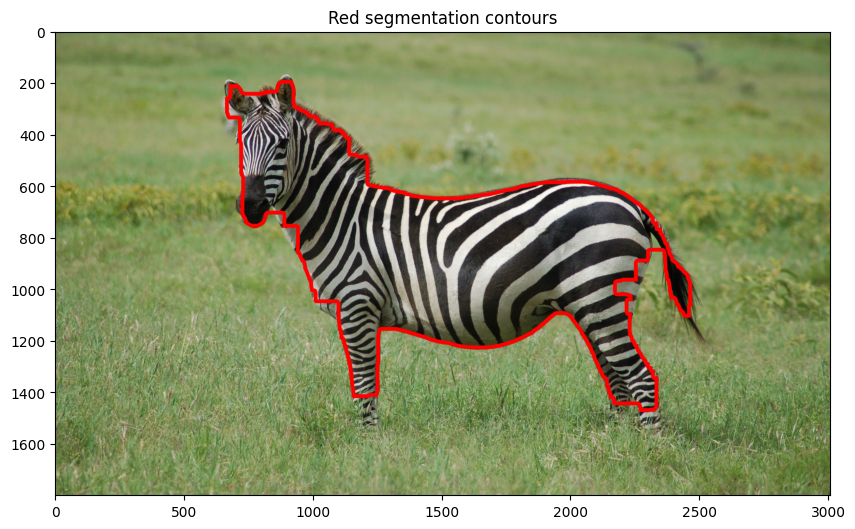

In [88]:
beta = 210000  # Optimal beta value to be determined

## Binary graph cut

# Create the graph.
g = maxflow.Graph[float]() # Graph instantiation
# Add the nodes. nodeids has the identifiers of the nodes in the grid.
nodeids = g.add_grid_nodes(I_zebra.shape[0:2]) # Create a grid with a non-terminal node for each pixel in the image
# Add non-terminal edges with the same capacity.
g.add_grid_edges(nodeids, beta) # Addition of a beta weight edge between each adjacent node according to the 4-connexity
# Add the terminal edges.

# TO BE COMPLETED
g.add_grid_tedges(nodeids, neg_log_likelihood_zebra_combined, neg_log_likelihood_background_combined)


# Find the maximum flow.
flow = g.maxflow()

print("Max Flow:", str(flow))
# Get the segments of the nodes in the grid.
sgm = g.get_grid_segments(nodeids)
im_bin = np.int_(np.logical_not(sgm))

plt.figure()
plt.imshow(im_bin, cmap="gray")
plt.title("Result of the segmentation")
plt.show()

plt.figure()
plt.imshow(display_segmentation_borders(I_zebra, im_bin))
plt.title("Red segmentation contours")
plt.show()

Q18: From the obtained segmentation, determine the mean vectors for 5 classes for the background and 5 classes for the zebra. Use these lists of mean vectors to construct new neg-log-likelihood combination images. Comment on them.

**Your answer &#x270D;**

A18:

In [84]:
# The computing of this cell can take several minutes.

X_1 = np.vstack([I_zebra[im_bin==1,i].flatten() for i in range(3)]).transpose()
kmeans_zebra2 = KMeans(n_clusters=5, random_state=0).fit(X_1)
mean_vectors_zebra2 = kmeans_zebra2.cluster_centers_

X_2 = np.vstack([I_zebra[im_bin==0,i].flatten() for i in range(3)]).transpose()
kmeans_background2 = KMeans(n_clusters=5, random_state=0).fit(X_2)
mean_vectors_background2 = kmeans_background2.cluster_centers_

C:\Users\m\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\m\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


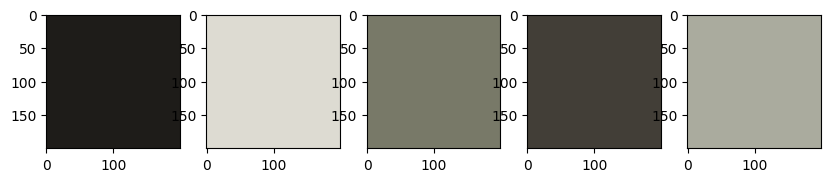

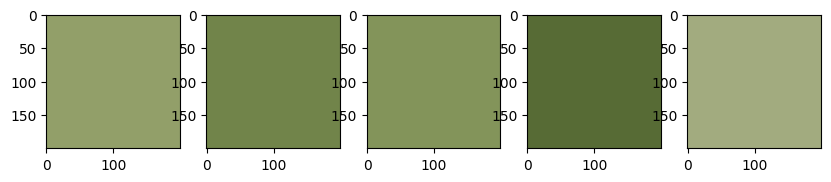

In [85]:
for k in range(5):
    class_k = np.ones((200,200,3),dtype=np.float64)* mean_vectors_background2[k] /255
    axs = plt.subplot(1,5,k+1)
    axs.imshow(class_k)
plt.show()

for k in range(5):
    class_k = np.ones((200,200,3),dtype=np.float64)* mean_vectors_zebra2[k] /255
    axs = plt.subplot(1,5,k+1)
    axs.imshow(class_k)
plt.show()

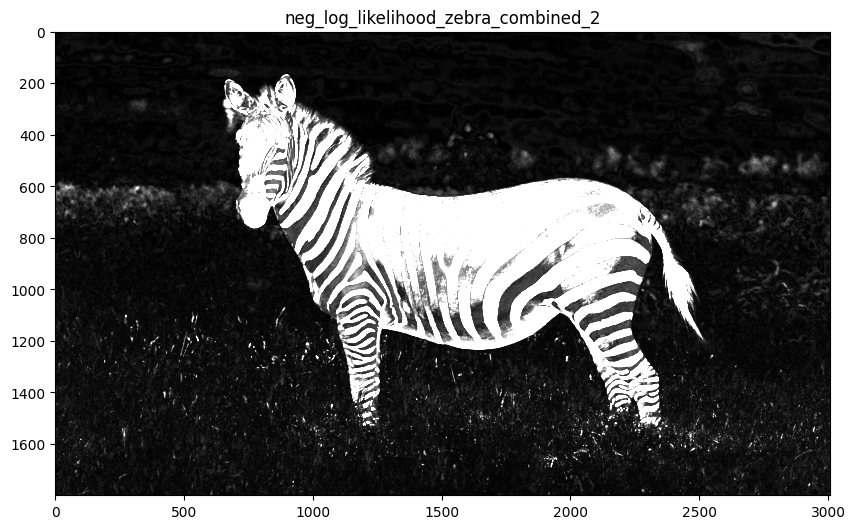

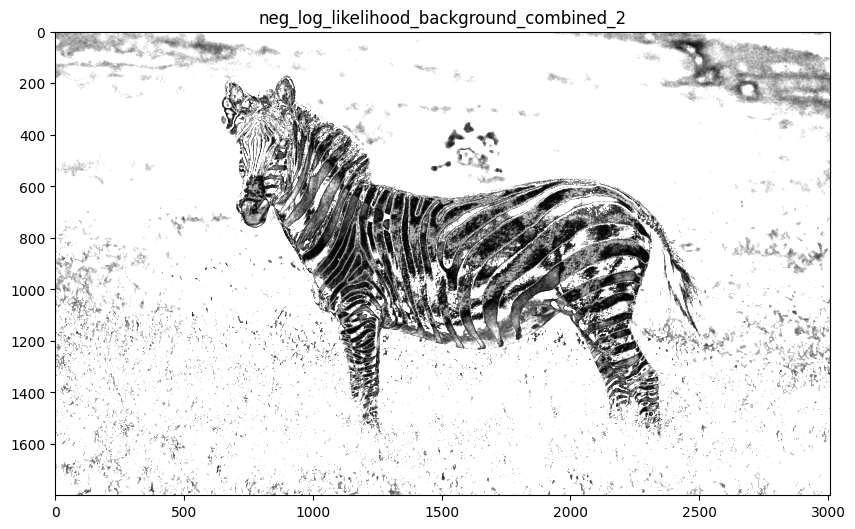

In [86]:
neg_log_likelihood_zebra_combined_2 = np.amin(np.dstack([(sum((I_zebra[:,:,i]-mean_vectors_zebra2[n_cl,i])**2 for i in range(3))) for n_cl in range(len(mean_vectors_zebra2))]),2)

neg_log_likelihood_background_combined_2 = np.amin(np.dstack([(sum((I_zebra[:,:,i]-mean_vectors_background2[n_cl,i])**2 for i in range(3))) for n_cl in range(len(mean_vectors_background2))]),2)

plt.figure()
plt.imshow(neg_log_likelihood_zebra_combined_2 ,cmap='gray', vmax = 3000)
plt.title("neg_log_likelihood_zebra_combined_2")
plt.show()

plt.figure()
plt.imshow(neg_log_likelihood_background_combined_2,cmap='gray', vmax = 1000)
plt.title("neg_log_likelihood_background_combined_2")
plt.show()


Q19: From these neg-log-likelihood images, segment the image by graph-cut using a new value of $\beta$ that gives you the best result. Comment on the result and the new value of $\beta$ that allowed you to obtain it. What about the new 5-class data attachment compared to the previous one?

**Your answer &#x270D;**

A19:

Max Flow: 1479693294.718867


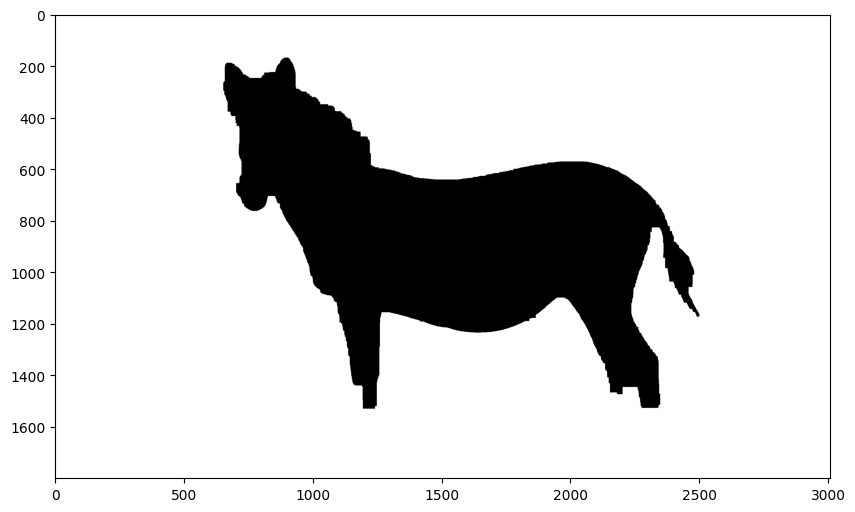

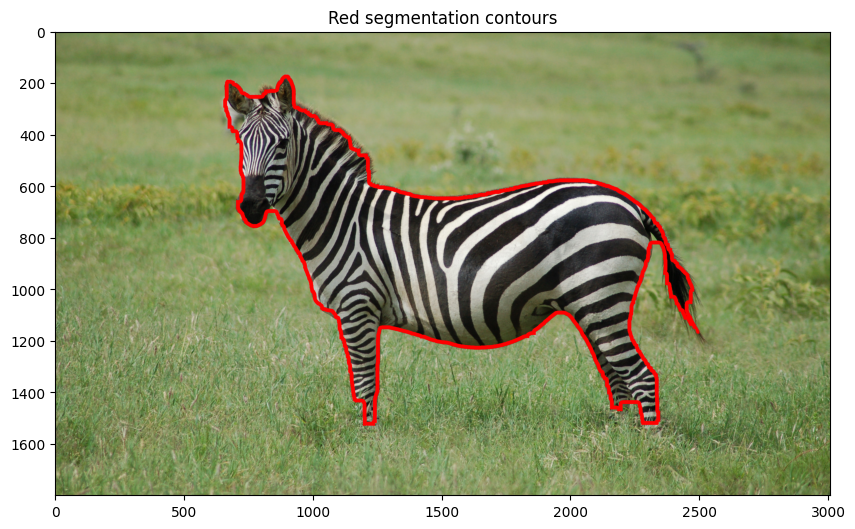

In [89]:
beta = 15000 # Optimal beta value to be determined

g = maxflow.Graph[float]() # Graph instantiation
# Add the nodes. nodeids has the identifiers of the nodes in the grid.
nodeids = g.add_grid_nodes(I_zebra.shape[0:2])
# Add non-terminal edges with the same capacity.
g.add_grid_edges(nodeids, beta)
# Add the terminal edges.
g.add_grid_tedges(nodeids,neg_log_likelihood_background_combined_2, neg_log_likelihood_zebra_combined_2)

flow = g.maxflow()

print("Max Flow:", str(flow))
# Get the segments of the nodes in the grid.
sgm = g.get_grid_segments(nodeids) # Returns 1 if the pixel is on the drain side after calculation of the min cut, 0 if it is on the source side
im_bin = np.int_(np.logical_not(sgm))

#affiche(im_bin, titre="Result for beta = " + str(beta))

plt.figure()
plt.imshow(im_bin, cmap="gray")
plt.show()

plt.figure()
plt.imshow(display_segmentation_borders(I_zebra, im_bin))
plt.title("Red segmentation contours")
plt.show()